In [1]:
import os
import numpy as np
from PIL import Image, ImageStat
import matplotlib.pyplot as plt
import cv2
import csv

from skimage.feature import graycomatrix, graycoprops

import time

In [2]:
def colour_balancing(img):
    img_resized = img.resize((256, 256))

    # Extract R, G, and B channels
    r, g, b = img_resized.split()

    # Calculate the mean values
    r_mean = ImageStat.Stat(r).mean[0]
    g_mean = ImageStat.Stat(g).mean[0]
    b_mean = ImageStat.Stat(b).mean[0]

    # Find the smallest mean value
    smallest_mean = min(r_mean, g_mean, b_mean)

    # Calculate scaling factors
    r_scaling_factor = smallest_mean / r_mean
    g_scaling_factor = smallest_mean / g_mean
    b_scaling_factor = smallest_mean / b_mean

    # Multiply each plane with the obtained scaling factors
    r_enhanced = r.point(lambda i: i * r_scaling_factor)
    g_enhanced = g.point(lambda i: i * g_scaling_factor)
    b_enhanced = b.point(lambda i: i * b_scaling_factor)

    # Recombine the planes to form the enhanced image
    img_enhanced = Image.merge("RGB", (r_enhanced, g_enhanced, b_enhanced))
    return img_enhanced

In [3]:
def image_segmentation(img):
    #RGB model is converted to the YCbCr model
    image_ycbcr = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2YCrCb)

    # Define thresholds for diseased part detection in YCbCr color space
    lower_threshold = np.array([0, 135, 85], dtype=np.uint8)  # Lower threshold for brown-black color
    upper_threshold = np.array([255, 180, 135], dtype=np.uint8)  # Upper threshold for brown-black color

    # Create a mask using the thresholds
    mask = cv2.inRange(image_ycbcr, lower_threshold, upper_threshold)
    segmented_image = cv2.bitwise_and(np.array(img), np.array(img), mask=mask)
    return segmented_image

In [4]:
def feature_extraction(label, img, angles = ['0', '45', '90','135'], properties = ['contrast', 'correlation', 'energy', 'homogeneity',  'ASM', 'dissimilarity']):
    # Convert the segmented image to grayscale
    gray_image = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    glcm = graycomatrix(gray_image, distances=[1], angles=angles, levels=256, symmetric=True, normed=True)
    # Extract GLCM properties
    features = []
    glcm_props = [propery for name in properties for propery in graycoprops(glcm, name)[0]]
    for item in glcm_props:
        features.append(item)
    features.append(label) 
    return features

In [5]:
def save_features(csv_file_path, angles, properties, features):
    columns = []
    for name in properties:
        for ang in angles:
            columns.append(name + "_" + ang)
    columns.append("label")
    #print(columns)
    
    # Check file existence and create if needed
    if not os.path.exists(csv_file_path):
        with open(csv_file_path, 'w', newline='') as csvfile:
            csv_writer = csv.writer(csvfile)
            csv_writer.writerow(columns)

    # Write data for each image (append mode)
    with open(csv_file_path, 'a', newline='') as csvfile:
        csv_writer = csv.writer(csvfile)
        csv_writer.writerow(features)

    print(columns)
    print(features)

In [6]:
def process_images(data_dir, csv_file_path, angles = ['0', '45', '90','135'], properties = ['contrast', 'correlation', 'energy', 'homogeneity',  'ASM', 'dissimilarity'], printImages = True):
    print("====================================================")
    print("==================Image Processing==================")
    print("====================================================")
    start_time = time.time()

    count = 0
    # Delete file if it exist
    if os.path.exists(csv_file_path):
        os.remove(csv_file_path)
        print(f"CSV file '{csv_file_path}' deleted successfully.")
    else:
        print(f"CSV file '{csv_file_path}' not found.")

    for class_dir in os.listdir(data_dir):
        class_label = class_dir 
        for img_file in os.listdir(os.path.join(data_dir, class_dir)):
            count += 1 
            img_path = os.path.join(data_dir, class_dir, img_file)
            img = Image.open(img_path)
            
            img_enhanced = colour_balancing(img)
            segmented_image = image_segmentation(img_enhanced)
            features = feature_extraction(class_label, segmented_image, angles, properties)

            print(count, class_label, img_file, "-------------------------------------------------------------")
            save_features(csv_file_path, angles, properties, features)

            if printImages:
                fig, axes = plt.subplots(1, 3, figsize=(8, 8))
                axes[0].axis('off')
                axes[0].imshow(img)
                axes[1].axis('off')
                axes[1].imshow(img_enhanced)
                axes[2].axis('off')
                axes[2].imshow(segmented_image)
                plt.show()
                
    print("Done!!")
    end_time = time.time()
    execution_time = end_time - start_time
    print(f"Execution time: {execution_time:.4f} seconds")

==================Image Processing==================
CSV file 'D:/pythonProject/Image-research/vision/c-color-train-50.csv' deleted successfully.
1 Pepper,_bell___Bacterial_spot 00f2e69a-1e56-412d-8a79-fdce794a17e4___JR_B.Spot 3132.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[320.99950980393317, 393.6283275663687, 305.0727634804025, 320.99950980393317, 0.7876172758883683, 0.7404970496678398, 0.7981264381176612, 0.7876172758883683, 0.9433527537887854, 0.9413931359998655, 0.943965371618528, 0.9433527537887854, 0.9457402730568595, 0.9434498145072051, 0.9462091420462424, 0.9457402730568595

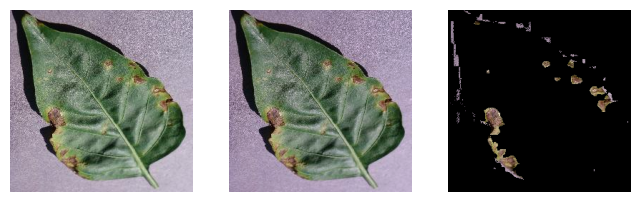

2 Pepper,_bell___Bacterial_spot 01dfb88b-cd5a-420c-b163-51f5fe07b74d___JR_B.Spot 9091.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[111.68180147058989, 143.1637985390346, 121.9026041666684, 111.68180147058989, 0.7447222041435461, 0.6724944219820995, 0.7200718053356151, 0.7447222041435461, 0.9586558754899122, 0.9564487159382902, 0.95815045570692, 0.9586558754899122, 0.9607227115225138, 0.9578601638913249, 0.9597738079731254, 0.9607227115225138, 0.9190210876113301, 0.914794146220004, 0.9180522957713785, 0.9190210876113301, 1.5533088235294372, 1.9389158016149084, 1.6878063725490373, 1.5533

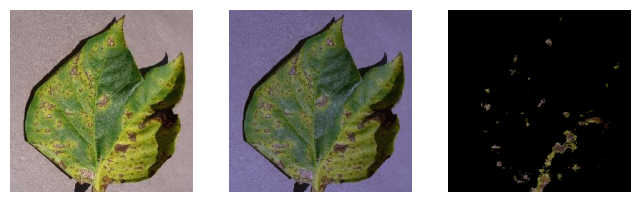

3 Pepper,_bell___Bacterial_spot 0a4c007d-41ab-4659-99cb-8a4ae4d07a55___NREC_B.Spot 1954.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[373.1984834559026, 450.8116878124353, 425.49928002452873, 373.1984834559026, 0.6670060479716265, 0.5990098855520578, 0.6209490367488496, 0.6670060479716265, 0.898797491824565, 0.8940657943517041, 0.8966234160825384, 0.898797491824565, 0.9036208128164345, 0.8981642333140383, 0.9014909087715152, 0.9036208128164345, 0.807836931310129, 0.7993536446297436, 0.8039335502675207, 0.807836931310129, 4.471951593137262, 5.246935793926006, 4.9640471813725355, 4.471951

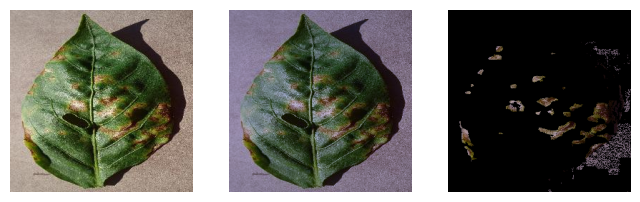

4 Pepper,_bell___Bacterial_spot 0abffc81-6be8-4b17-a83c-4d2830e30382___JR_B.Spot 9076.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[100.24439338235375, 124.69534794310263, 88.49517463235337, 100.24439338235375, 0.5648575177255775, 0.4591723714051036, 0.6146916397504654, 0.5648575177255775, 0.9829046630404048, 0.9816689483376575, 0.9833335559225759, 0.9829046630404048, 0.9834619051098035, 0.9821051848758514, 0.983888719407328, 0.9834619051098035, 0.9661015766265718, 0.9636739241303625, 0.9669448822033376, 0.9661015766265718, 1.0096200980392271, 1.22600538254521, 0.9185814950980513, 1.009

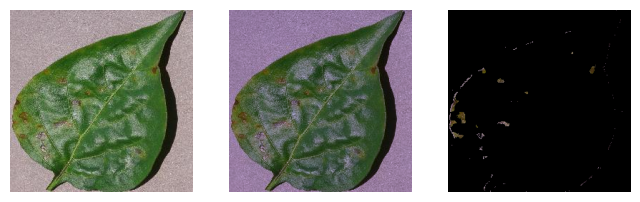

5 Pepper,_bell___Bacterial_spot 0b27c03f-b3bc-4d96-9b76-6fbd779404b9___NREC_B.Spot 1799.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[240.8263020833376, 259.8732333717894, 250.84387254902387, 240.8263020833376, 0.4529592314027633, 0.41137629019793887, 0.4370923095182616, 0.4529592314027633, 0.9254694214654396, 0.9224234856006533, 0.9238766434764911, 0.9254694214654396, 0.9408297581428476, 0.9350442347124823, 0.9391210218494207, 0.9408297581428476, 0.8564936500675756, 0.8508650867876587, 0.8535480523613874, 0.8564936500675756, 2.679641544117672, 2.9511264898117275, 2.813296568627477, 2.6

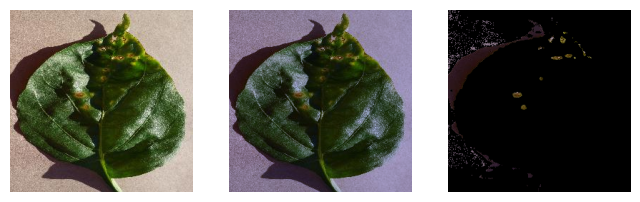

6 Pepper,_bell___Bacterial_spot 0b47ce18-7cfe-45e8-b21e-b83cb6282455___JR_B.Spot 3162.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[117.90511642157185, 158.9761476355441, 136.96908700980774, 117.90511642157185, 0.8712376613779164, 0.8270379465586091, 0.8504181964482754, 0.8712376613779164, 0.9488515866794154, 0.9472208712833237, 0.9487903484340863, 0.9488515866794154, 0.9527784898843621, 0.9502816964024962, 0.9530959719474803, 0.9527784898843621, 0.900319333544044, 0.8972273789947388, 0.9002031252816749, 0.900319333544044, 1.397426470588271, 1.7905420991928067, 1.4809742647059323, 1.397

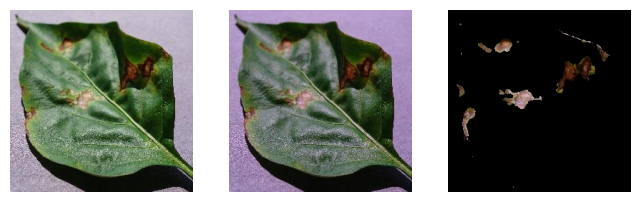

7 Pepper,_bell___Bacterial_spot 0bd0f439-013b-40ed-a6d1-4e67e971d437___JR_B.Spot 3272.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[178.2782475490272, 236.72119953865774, 158.75278799020435, 178.2782475490272, 0.8874078948426662, 0.8510258013439518, 0.8997392511697322, 0.8874078948426662, 0.8748688193907179, 0.8713010694376763, 0.875419367545289, 0.8748688193907179, 0.9038537942693746, 0.8917919296952086, 0.9011358386007621, 0.9038537942693746, 0.7653954511421086, 0.7591655536032385, 0.7663590690733938, 0.7653954511421086, 2.231678921568658, 2.9917723952328537, 2.1747549019608288, 2.231

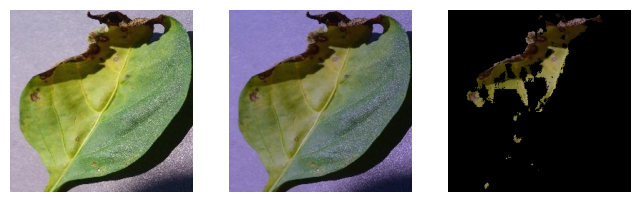

8 Pepper,_bell___Bacterial_spot 0c1eb1fd-9e3a-4396-81bc-7d1d3eccc5ed___JR_B.Spot 3369.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[177.95886948529815, 241.9635524798264, 159.18794424019956, 177.95886948529815, 0.8042717042127587, 0.7343817723735236, 0.8256879879296916, 0.8042717042127587, 0.9234427017421798, 0.9198049208115263, 0.9228294177749233, 0.9234427017421798, 0.9424129585008316, 0.9330664620583522, 0.9386346796180368, 0.9424129585008316, 0.8527464234008963, 0.8460410923490982, 0.8516141343108039, 0.8527464234008963, 2.0311427696078734, 2.7558016147636852, 1.9961856617647398, 2.

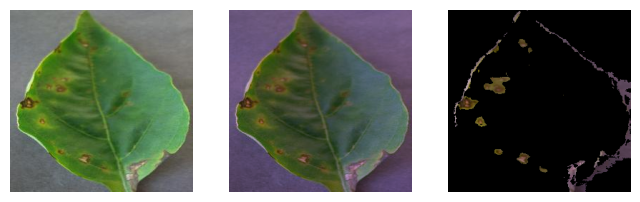

9 Pepper,_bell___Bacterial_spot 0c2392f6-3e69-4baf-b9f3-197623f6631a___JR_B.Spot 3176.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[126.54699754902157, 193.2763552479964, 157.33454350490535, 126.54699754902157, 0.8644615296990215, 0.7937523812463279, 0.8314673040019591, 0.8644615296990215, 0.9651964460317117, 0.9631223940265923, 0.9644611791405857, 0.9651964460317117, 0.9682988383018328, 0.9650168191402881, 0.9666143713959136, 0.9682988383018328, 0.931604179432247, 0.9276047458755144, 0.930185366069249, 0.931604179432247, 1.1899203431372747, 1.7817916186083622, 1.4695618872549205, 1.189

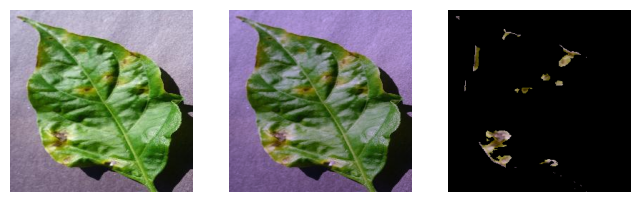

10 Pepper,_bell___Bacterial_spot 0c4e75b2-e4aa-437e-815c-636271d66bec___JR_B.Spot 3244.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[142.22729779412197, 225.41351787777126, 187.4855698529479, 142.22729779412197, 0.864965004649346, 0.7867884593315743, 0.8219954014027945, 0.864965004649346, 0.949402974494936, 0.947190056035132, 0.9483919834292184, 0.949402974494936, 0.9522416544934376, 0.9492847402063377, 0.9508160575274643, 0.9522416544934376, 0.9013660079798321, 0.8971690022518364, 0.8994473542328069, 0.9013660079798321, 1.7337622549020164, 2.4157477893121517, 2.1061887254902594, 1.7337

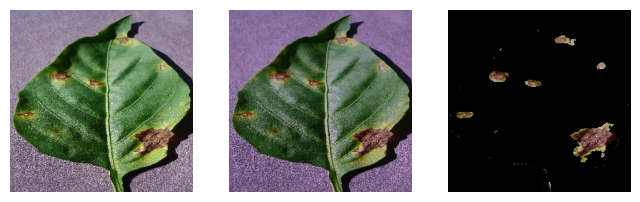

11 Pepper,_bell___Bacterial_spot 0c99cb45-b4e0-4ade-bba5-fab3b678f0bb___JR_B.Spot 8912.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[2261.2318780638134, 2634.8399538640297, 2344.458134191277, 2261.2318780638134, 0.5796996183081635, 0.5084944128984958, 0.5647340807484882, 0.5796996183081635, 0.7759320050173844, 0.7671816715584234, 0.7737267175280996, 0.7759320050173844, 0.7952098015078967, 0.7810261357159287, 0.7899759635881068, 0.7952098015078967, 0.6020704764102981, 0.5885677171751766, 0.5986530334168076, 0.6020704764102981, 17.019837622549414, 19.656101499423976, 17.640211397059225, 1

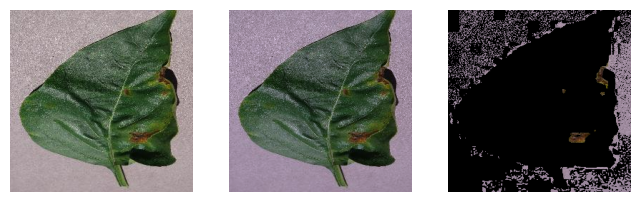

12 Pepper,_bell___Bacterial_spot 0ce74db6-be9b-4c43-a104-6a3f9bcd2de2___NREC_B.Spot 1827.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[265.084206495109, 310.65550173013435, 289.8619332107962, 265.084206495109, 0.7171426870861756, 0.6666988131237354, 0.6902942331436012, 0.7171426870861756, 0.8502781975972653, 0.8460273692390485, 0.8473047673718315, 0.8502781975972653, 0.8998356308921268, 0.8865336838134242, 0.8923207401472306, 0.8998356308921268, 0.7229730133092541, 0.7157623095015453, 0.7179253688110335, 0.7229730133092541, 3.1714920343137867, 3.7562475970783935, 3.49560355392165, 3.171

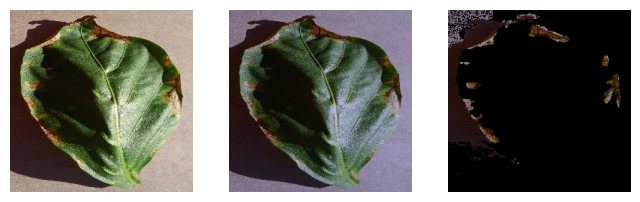

13 Pepper,_bell___Bacterial_spot 0d2635e7-df23-4ceb-b3ba-3af50bb58357___NREC_B.Spot 1874.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[320.5476868872667, 338.5376855055917, 329.70278799020804, 320.5476868872667, 0.6625448213543687, 0.6414539347752797, 0.6546975848080328, 0.6625448213543687, 0.8698464057006241, 0.8689800025958512, 0.8689891134034464, 0.8698464057006241, 0.8904902149345838, 0.8857712844989789, 0.8888351625114139, 0.8904902149345838, 0.7566327695102948, 0.7551262449114856, 0.7551420792137079, 0.7566327695102948, 4.302558210784342, 4.520246059208224, 4.424846813725495, 4.30

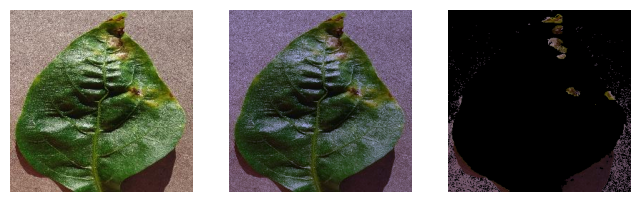

14 Pepper,_bell___Bacterial_spot 0d9b55df-a8c0-4784-b1e4-957c8d679513___NREC_B.Spot 1825.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[282.63054534314324, 312.69480968859045, 284.70778186275095, 282.63054534314324, 0.7824061838972096, 0.7580762193718569, 0.7813339563357633, 0.7824061838972096, 0.8436523763433434, 0.8407659986476504, 0.8421828952461452, 0.8436523763433434, 0.8972072821662288, 0.8812649088672209, 0.889757815736089, 0.8972072821662288, 0.7117493321097703, 0.706887464481981, 0.7092720290451796, 0.7117493321097703, 3.0673713235294637, 3.4669127258747743, 3.1296262254902416, 

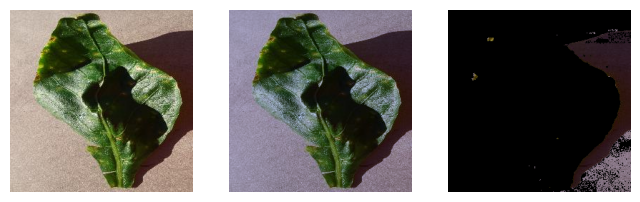

15 Pepper,_bell___Bacterial_spot 0efa6329-22f4-4bf0-a67a-17b0d5e4d2f2___NREC_B.Spot 9145.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[168.59825367647343, 219.3749942330069, 167.56508884804217, 168.59825367647343, 0.7423793124520583, 0.665565684796662, 0.7435761287308007, 0.7423793124520583, 0.9614743344833283, 0.9594780421227812, 0.9617193933084673, 0.9614743344833283, 0.9627635006298184, 0.9606725136734374, 0.9631611152549223, 0.9627635006298184, 0.9244328958701591, 0.9205981133157656, 0.9249041914656065, 0.9244328958701591, 1.8785232843137594, 2.2873817762401116, 1.842662377451014, 1

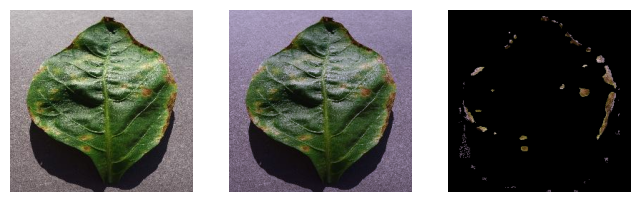

16 Pepper,_bell___Bacterial_spot 0f72db9c-d635-4415-9781-68937328aed2___NREC_B.Spot 9188.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[192.55617340686774, 226.20415224916195, 166.53468137255305, 192.55617340686774, 0.736946952557784, 0.6920015477586742, 0.772794657058486, 0.736946952557784, 0.9522217940253415, 0.9501123184550597, 0.9527119489115444, 0.9522217940253415, 0.9541615223381176, 0.9516809031493144, 0.9544823186727515, 0.9541615223381176, 0.9067263450168398, 0.9027134176800488, 0.9076600575988333, 0.9067263450168398, 2.1540287990196525, 2.4890888119956878, 2.003370098039267, 2.

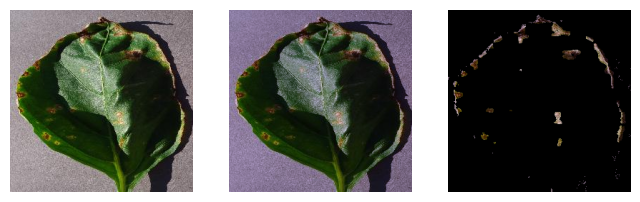

17 Pepper,_bell___Bacterial_spot 1ade72cf-f7e0-4282-92d9-614bf05289a0___NREC_B.Spot 1975.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[437.95237438727116, 488.8828758170121, 453.8225183823673, 437.95237438727116, 0.8680154151556169, 0.8518503978828016, 0.8629100670060109, 0.8680154151556169, 0.8040287538549783, 0.8022617795486615, 0.8033855436525486, 0.8040287538549783, 0.8195816315941413, 0.8164200470957429, 0.8176150372147829, 0.8195816315941413, 0.6464622370255894, 0.6436239629245852, 0.645428331749901, 0.6464622370255894, 5.72792585784322, 6.170626682045649, 5.868780637254972, 5.727

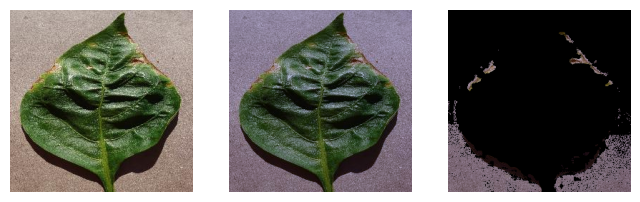

18 Pepper,_bell___Bacterial_spot 1aeb4d06-0069-4fea-be9f-3200ac2e9373___NREC_B.Spot 1909.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[775.7174172794769, 834.7942945022155, 766.8760416667301, 775.7174172794769, 0.8085513373207002, 0.7924764756847308, 0.8098522915633671, 0.8085513373207002, 0.7923530959122967, 0.7896477078930766, 0.7925364680645663, 0.7923530959122967, 0.8103307955960838, 0.8045960234267995, 0.8091187117958202, 0.8103307955960838, 0.6278234286018014, 0.6235435025807896, 0.6281140532122574, 0.6278234286018014, 7.687454044117966, 8.208704344483841, 7.671078431372837, 7.687

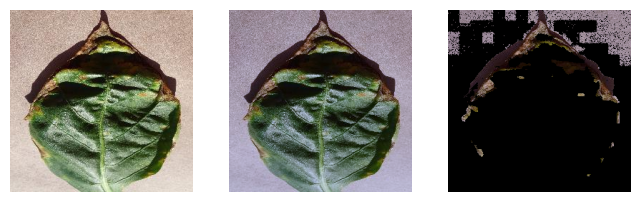

19 Pepper,_bell___Bacterial_spot 1c0c1501-f362-49d0-9e99-e72006441c8c___JR_B.Spot 8869.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[279.2749387254937, 341.73134948098345, 321.23089767157296, 279.2749387254937, 0.6473922009528852, 0.5682483611831022, 0.5964352885289241, 0.6473922009528852, 0.9720456302671684, 0.9706598739109008, 0.9712187256156155, 0.9720456302671684, 0.9738952582230518, 0.9717966705983087, 0.9725109863526097, 0.9738952582230518, 0.9448727073214966, 0.9421805908207258, 0.9432658129864202, 0.9448727073214966, 2.1095894607843113, 2.5504805843907232, 2.4048866421568706, 2.

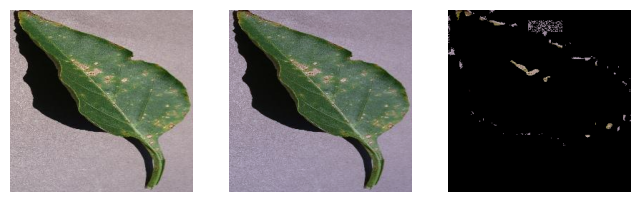

20 Pepper,_bell___Bacterial_spot 1cb295da-e568-4168-a29c-48ab980f3772___NREC_B.Spot 9250.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[64.30136335784378, 93.75260284506572, 73.12555147058886, 64.30136335784378, 0.8332834671988529, 0.7578601170181596, 0.8104311593151187, 0.8332834671988529, 0.9809437503497407, 0.979807932734591, 0.9804995318086369, 0.9809437503497407, 0.9816832880593772, 0.9804200488597824, 0.9810777411280834, 0.9816832880593772, 0.9622506413502144, 0.9600235850496328, 0.9613793318769562, 0.9622506413502144, 0.7630974264706001, 1.0187312572088283, 0.847549019607858, 0.76

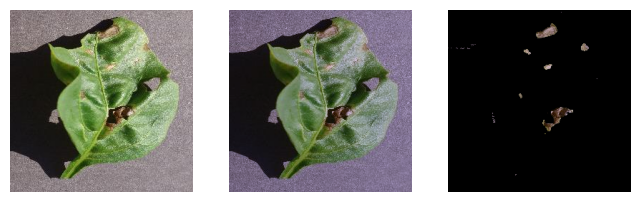

21 Pepper,_bell___Bacterial_spot 1cce64aa-6f9f-4ce1-b319-dbc4a012b240___JR_B.Spot 8998.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[152.59120710784583, 209.93154940409295, 161.12712928921854, 152.59120710784583, 0.7833527053772633, 0.7027464835794828, 0.7712937545712847, 0.7833527053772633, 0.9647370517511191, 0.9626151509803827, 0.9644460408128814, 0.9647370517511191, 0.9660565172543667, 0.9635841358052766, 0.9656898500444022, 0.9660565172543667, 0.9307175790214415, 0.926627928896985, 0.9301561656396421, 0.9307175790214415, 1.6598345588235577, 2.1512187620147847, 1.7432751225490517, 1

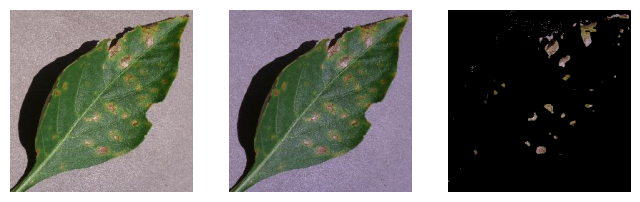

22 Pepper,_bell___Bacterial_spot 1d26f9c5-2f4e-4b1e-a7d6-a4e9584a3ab7___JR_B.Spot 8918.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[142.09332107843505, 268.0974702037898, 206.97840073529875, 142.09332107843505, 0.841766209163917, 0.7020329116475074, 0.769097825677454, 0.841766209163917, 0.9499394280342643, 0.9450841149518091, 0.9475960055391498, 0.9499394280342643, 0.9541477862866029, 0.9474517130762947, 0.9506388809849811, 0.9541477862866029, 0.9023849169340653, 0.8931839843342444, 0.8979381897137524, 0.9023849169340653, 1.600398284313767, 2.7550634371397744, 2.2132965686274946, 1.600

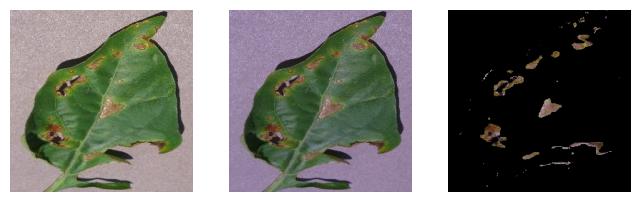

23 Pepper,_bell___Bacterial_spot 1d2949cc-b0fa-4a29-8540-2983230c34e9___JR_B.Spot 9017.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[111.18869485294766, 165.66605151865997, 136.74906556373332, 111.18869485294766, 0.8744547172982311, 0.8134753806697319, 0.8454775796615073, 0.8744547172982311, 0.9102803409864674, 0.9062382294641586, 0.9087486637275176, 0.9102803409864674, 0.9161397265798311, 0.9107475678465129, 0.9139005597890649, 0.9161397265798311, 0.8286102991864392, 0.821267728542333, 0.8258241338265488, 0.8286102991864392, 2.0896752450981575, 2.8256670511343818, 2.4284160539216955, 2

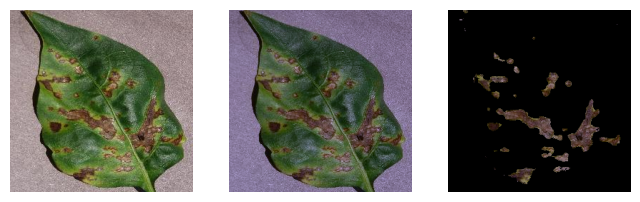

24 Pepper,_bell___Bacterial_spot 1d46d97c-17ae-41e2-9ac3-6a984804760e___JR_B.Spot 8825.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[9.050612745098055, 12.223790849673302, 9.931096813725514, 9.050612745098055, 0.6165841850936317, 0.4841763338636907, 0.5792837805582908, 0.6165841850936317, 0.9973192560782295, 0.9970011739810215, 0.9971813903747869, 0.9973192560782295, 0.9975674612637753, 0.9971330105290752, 0.9973279240212498, 0.9975674612637753, 0.9946456985444331, 0.994011340919535, 0.9943707253097931, 0.9946456985444331, 0.10533088235294165, 0.1528335255670905, 0.12570465686274587, 0.

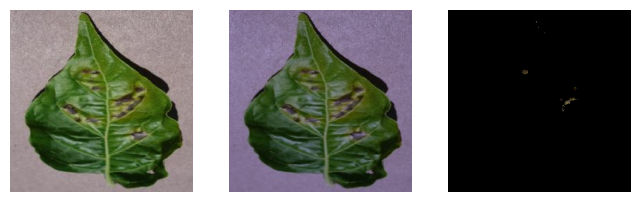

25 Pepper,_bell___Bacterial_spot 1f3b1b11-4934-4c0b-b054-8f8a977b488c___JR_B.Spot 3373.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[88.34244791666798, 133.92216839678233, 109.90107230392336, 88.34244791666798, 0.8493486947923113, 0.7723698021351962, 0.8126252588892113, 0.8493486947923113, 0.9675707339192761, 0.9659826537107505, 0.9671111886290945, 0.9675707339192761, 0.9698296402686184, 0.9675401571207554, 0.9692589261188684, 0.9698296402686184, 0.9361931251370864, 0.9331224872700639, 0.9353040511715801, 0.9361931251370864, 1.0473498774510062, 1.472033833141227, 1.220588235294146, 1.04

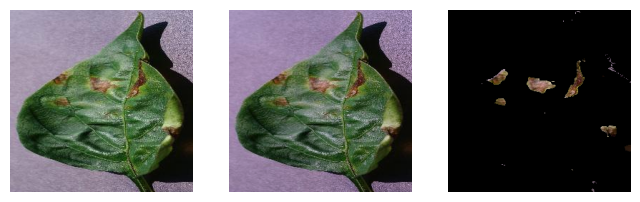

26 Pepper,_bell___Bacterial_spot 2f26c2e1-a13d-41c9-9adf-51fb0ad99785___NREC_B.Spot 1849.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[163.62976409314092, 182.79223375626123, 161.98995098039558, 163.62976409314092, 0.6293731104809916, 0.5873844943961138, 0.6349898854471798, 0.6293731104809916, 0.86636831038475, 0.8616196233457977, 0.8651988480798325, 0.86636831038475, 0.9008278580849425, 0.8893405168748065, 0.8980409516052198, 0.9008278580849425, 0.7505940492389266, 0.7423883753345542, 0.748569046718669, 0.7505940492389266, 2.703599877451018, 3.05846981930049, 2.738082107843182, 2.70359

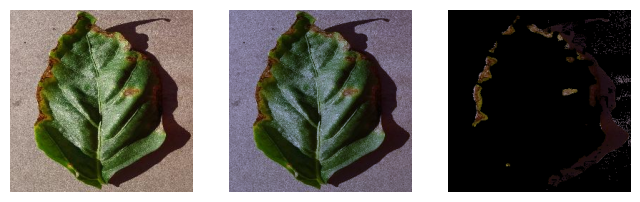

27 Pepper,_bell___Bacterial_spot 3a03526d-0bf4-4898-9f0f-8a9c31afd3eb___JR_B.Spot 3380.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[164.99813112746574, 204.5147251057514, 174.6961703431516, 164.99813112746574, 0.8534678606499395, 0.8190139285693948, 0.8448551907726239, 0.8534678606499395, 0.8796742698252675, 0.8776493071902086, 0.8797048253822621, 0.8796742698252675, 0.8889976068594135, 0.8852961886594998, 0.8879719861429686, 0.8889976068594135, 0.7738268209926176, 0.7702683064114532, 0.7738805798008364, 0.7738268209926176, 2.7772977941178274, 3.285690119185262, 2.942156862745291, 2.77

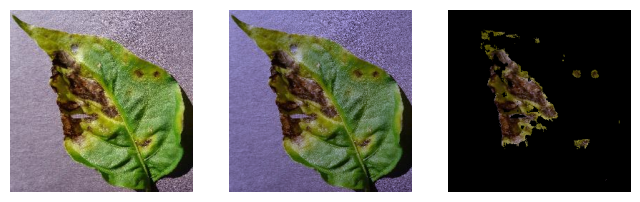

28 Pepper,_bell___Bacterial_spot 4d035250-f831-438b-a583-d192cbb26a55___JR_B.Spot 3163.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[161.53039215686675, 261.5735178777687, 209.08262867647582, 161.53039215686675, 0.7978316560314025, 0.6733747309850655, 0.7392124662101944, 0.7978316560314025, 0.9604017354945174, 0.9572017384340332, 0.9588240059773193, 0.9604017354945174, 0.9626230100705064, 0.9584312450732012, 0.9602770340003335, 0.9626230100705064, 0.9223714935408808, 0.9162351680611353, 0.9193434744383944, 0.9223714935408808, 1.625459558823565, 2.437493271818798, 2.039950980392207, 1.62

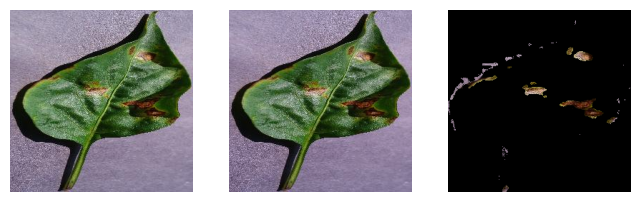

29 Pepper,_bell___Bacterial_spot 4f539b76-13f8-43ab-a630-0cc6b1461bc9___JR_B.Spot 3381.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[111.14736519608664, 147.68055363322304, 113.10376838236064, 111.14736519608664, 0.9308966145325409, 0.9085018915567812, 0.9296802646598066, 0.9308966145325409, 0.8810685565196996, 0.8784953152732095, 0.8808542225222785, 0.8810685565196996, 0.8940491843327057, 0.8900258657414521, 0.8944412604284588, 0.8940491843327057, 0.7762818012877071, 0.7717540189569757, 0.7759041613353277, 0.7762818012877071, 1.8692095588236763, 2.302622068435312, 1.851501225490327, 1.

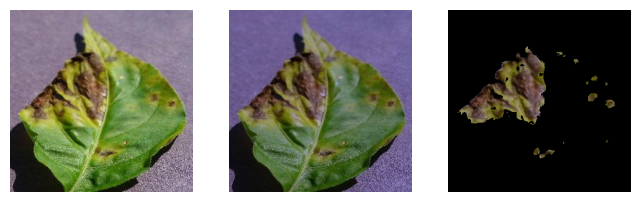

30 Pepper,_bell___Bacterial_spot 5d3a800b-58ed-41f4-ad9a-ad92217a5316___JR_B.Spot 9027.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[165.5902267156897, 236.6500730488499, 174.39538909314058, 165.5902267156897, 0.7844198076051175, 0.6930091035006709, 0.7729098892672569, 0.7844198076051175, 0.9596512903698705, 0.956879055168487, 0.9594675104197463, 0.9596512903698705, 0.9608671512363527, 0.9581351150052955, 0.9607447319473308, 0.9608671512363527, 0.9209305991085576, 0.9156175262201364, 0.920577903551066, 0.9209305991085576, 1.8925857843137635, 2.4969011918495148, 1.970266544117685, 1.8925

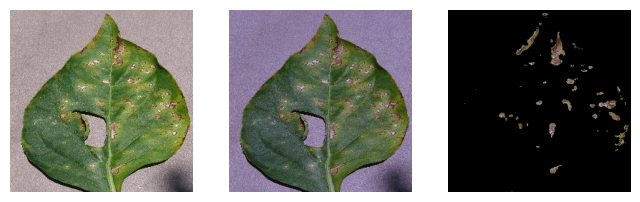

31 Pepper,_bell___healthy 01fbd010-0cc1-4c48-98bc-49e328bf9bbc___JR_HL 8584.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[190.84658394607928, 247.47769319492676, 203.97830882353028, 190.84658394607928, 0.3894848106162551, 0.21138877136865813, 0.354170056233157, 0.3894848106162551, 0.9855397159416263, 0.9843451168926926, 0.9854018123463805, 0.9855397159416263, 0.9858171914965054, 0.9845420253626106, 0.9857765330882551, 0.9858171914965054, 0.9712885316983014, 0.9689353091504885, 0.9710167317755313, 0.9712885316983014, 1.4745863970588255, 1.822452902729733, 1.5289828431372574, 1.4745863970

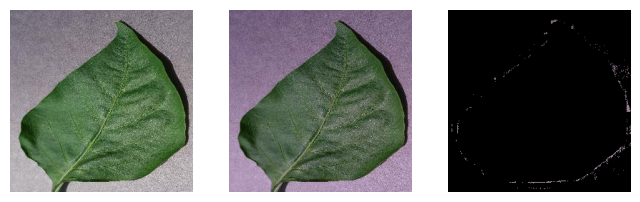

32 Pepper,_bell___healthy 0a3f2927-4410-46a3-bfda-5f4769a5aaf8___JR_HL 8275.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[717.3664981617917, 854.3268589004343, 649.9649662990421, 717.3664981617917, 0.7929322904275955, 0.7520474822783468, 0.8120531023673927, 0.7929322904275955, 0.8762942559497497, 0.8737803790694785, 0.8774732395892177, 0.8762942559497497, 0.8884166460102473, 0.8835335655896367, 0.8912024092631415, 0.8884166460102473, 0.7678916230105255, 0.7634921508468016, 0.7699592861951968, 0.7678916230105255, 5.564598651960829, 6.526074586697518, 5.123514093137265, 5.564598651960829,

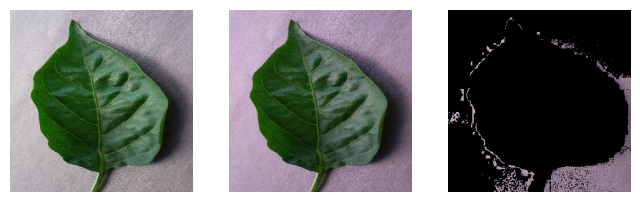

33 Pepper,_bell___healthy 0b76f650-27cf-4b62-b3ad-c97d81e0db0c___JR_HL 8554.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[912.6573988970772, 1066.6975317185836, 915.1438112745295, 912.6573988970772, 0.828950488323579, 0.8002897707540438, 0.8293032895286764, 0.828950488323579, 0.8050478181812603, 0.8009814123742016, 0.8041899684663049, 0.8050478181812603, 0.8202730528595296, 0.8135447014327313, 0.8189919113274742, 0.8202730528595296, 0.6481019895584075, 0.6415712229689708, 0.6467215053818365, 0.6481019895584075, 7.910309436274517, 9.141699346405398, 7.955514705882419, 7.910309436274517, 

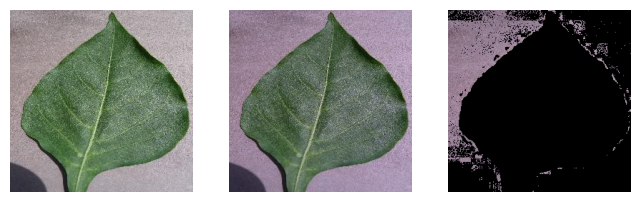

34 Pepper,_bell___healthy 0ba474dd-0cfd-4fd2-a58c-8e3d18dbe7c3___JR_HL 8395.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[41.66695772058845, 48.91775470972715, 46.19509803921583, 41.66695772058845, 0.4021259794344372, 0.2878032901745974, 0.3254057782729164, 0.4021259794344372, 0.9930148372712926, 0.992449255251017, 0.9925706338377241, 0.9930148372712926, 0.9933397800444601, 0.9926434446097958, 0.992848916958301, 0.9933397800444601, 0.9860784670409316, 0.9849555242482982, 0.9851964631570215, 0.9860784670409316, 0.4478400735294143, 0.5309496347558657, 0.5113664215686302, 0.447840073529414

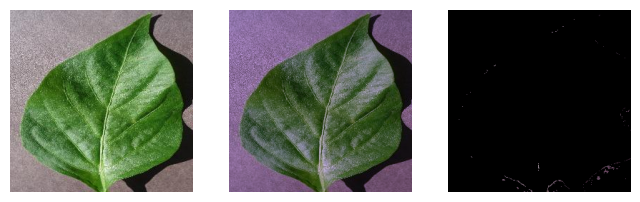

35 Pepper,_bell___healthy 0e043e9a-7652-4e7a-aef1-0caa0c085f55___JR_HL 8479.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[134.03561580882422, 159.53219530949673, 123.44687500000062, 134.03561580882422, 0.2392855598470523, 0.09809734744394161, 0.3043689141287444, 0.2392855598470523, 0.9892006840422024, 0.9884663613356883, 0.9894304554353914, 0.9892006840422024, 0.9893659895196245, 0.9885045189681014, 0.9897158055159205, 0.9893659895196245, 0.9785179933095612, 0.9770657474922155, 0.978972626143086, 0.9785179933095612, 1.0983609068627491, 1.2790003844675157, 1.024264705882356, 1.0983609068

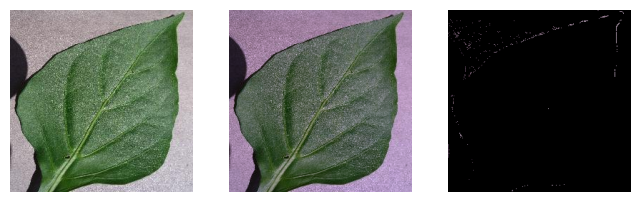

36 Pepper,_bell___healthy 0e05c3e0-7766-4049-b7a8-563b5c028c33___JR_HL 8828.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[746.9161151961267, 874.1238754325449, 726.4006587010308, 746.9161151961267, 0.9091300363342188, 0.8935549019934066, 0.9114824838819552, 0.9091300363342188, 0.7466568396615818, 0.7439724733540009, 0.7465192621737888, 0.7466568396615818, 0.7607589481885482, 0.7570048666255151, 0.7612400673668387, 0.7607589481885482, 0.557496436213421, 0.5534950411084696, 0.5572910087964981, 0.557496436213421, 7.930545343137516, 8.834586697424543, 7.811504289216013, 7.930545343137516, '

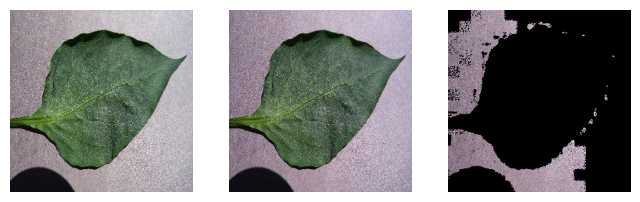

37 Pepper,_bell___healthy 0e1942a4-91d7-460a-8189-1a4e693cfc84___JR_HL 8896.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[16.532031250000017, 16.98748173779314, 17.02622549019609, 16.532031250000017, 0.08179228086883485, 0.05616596072686769, 0.06815485274151589, 0.08179228086883485, 0.9961857628783382, 0.9961708054259588, 0.9961551255087631, 0.9961857628783382, 0.9962053014469494, 0.9961929898485721, 0.9961588414375571, 0.9962053014469494, 0.9923860741614966, 0.9923562735830036, 0.9923250340773796, 0.9923860741614966, 0.24134497549019626, 0.2458900422914262, 0.24610906862745122, 0.24134

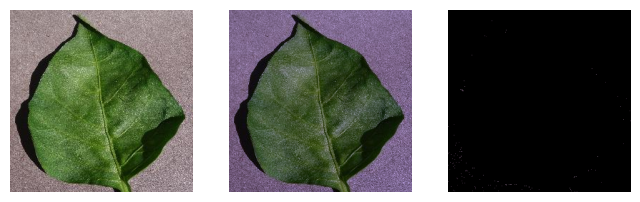

38 Pepper,_bell___healthy 0e526c7b-72ee-4547-916b-5cba013097b6___JR_HL 7735.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[194.10436580882728, 259.0805997693252, 189.81055453431767, 194.10436580882728, 0.6868387421087352, 0.5814829861082059, 0.6922840928818543, 0.6868387421087352, 0.9627002353253982, 0.9606935634757715, 0.9629147219419245, 0.9627002353253982, 0.966801138024411, 0.9633033465335409, 0.9659351571874811, 0.966801138024411, 0.926791743095577, 0.9229321229037762, 0.9272047617324938, 0.926791743095577, 1.7410386029411966, 2.2612533640908037, 1.7441329656862972, 1.74103860294119

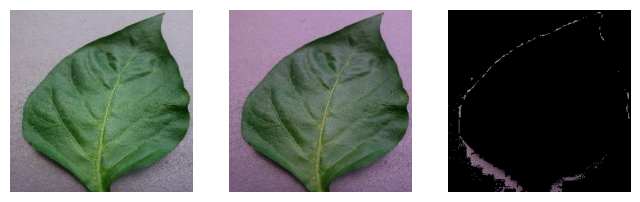

39 Pepper,_bell___healthy 0e5d9ac1-4de8-491e-ab95-809850866805___JR_HL 8534.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[0.7820159313725492, 0.7850826605151864, 0.7820159313725492, 0.7820159313725492, -6.031131809455121e-05, -6.054784738794351e-05, -6.031131809455121e-05, -6.031131809455121e-05, 0.9998774519191489, 0.9998769713421356, 0.9998774519191489, 0.9998774519191489, 0.9998774715416201, 0.9998769910378613, 0.9998774715416201, 0.9998774715416201, 0.9997549188563299, 0.999753957820322, 0.9997549188563299, 0.9997549188563299, 0.00971200980392157, 0.009750096116878123, 0.00971200980

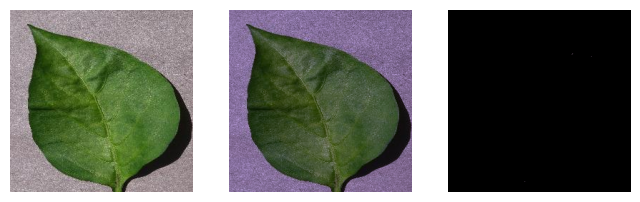

40 Pepper,_bell___healthy 0e69c47d-72c6-4fc6-9437-910c95b183dc___JR_HL 8113.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[1705.3329197304677, 1721.061806997367, 1730.2944087010649, 1705.3329197304677, 0.6858001934430373, 0.6822557788683573, 0.6814391427007067, 0.6858001934430373, 0.711088617827834, 0.7115706656999667, 0.7101549916205498, 0.711088617827834, 0.724261514206115, 0.7242555556532454, 0.7233146162850015, 0.724261514206115, 0.5056470224042993, 0.5063328122846938, 0.5043201121235833, 0.5056470224042993, 15.758409926470382, 15.911264898116515, 15.94253982843122, 15.75840992647038

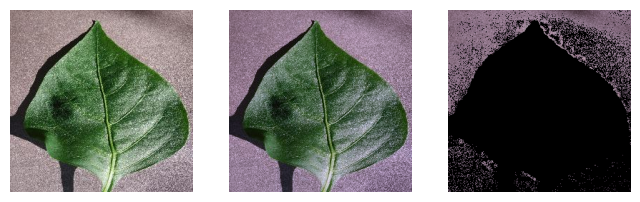

41 Pepper,_bell___healthy 0eabc3c2-d492-4227-90d8-14dab9fd4a9a___JR_HL 8699.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[1404.420419730423, 1616.111803152672, 1507.4569393382671, 1404.420419730423, 0.6278409559261197, 0.5694136196826346, 0.5985099702724163, 0.6278409559261197, 0.8034843992212289, 0.7974690688369945, 0.8012335994007472, 0.8034843992212289, 0.8202286530079796, 0.8097627954537794, 0.8157090653245836, 0.8202286530079796, 0.6455871797918993, 0.6359569157517431, 0.641975280808677, 0.6455871797918993, 12.079518995098013, 13.85424067666294, 12.894531249999975, 12.0795189950980

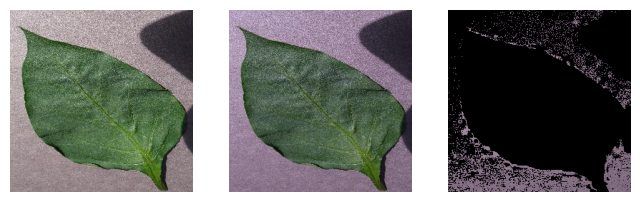

42 Pepper,_bell___healthy 0eb476b9-8b21-4b24-adef-7db813abbca3___JR_HL 7926.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[181.05326286764833, 212.96179930796228, 198.4177389705891, 181.05326286764833, 0.5491147821776171, 0.46375849502300354, 0.49875303650571723, 0.5491147821776171, 0.980929136892662, 0.9801163754416081, 0.9806075180174408, 0.980929136892662, 0.9816179547328207, 0.9806545352405329, 0.9811747492251862, 0.9816179547328207, 0.9622219716049828, 0.9606281094087953, 0.9615911043923256, 0.9622219716049828, 1.5522824754901996, 1.7900346020761642, 1.6786151960784348, 1.5522824754

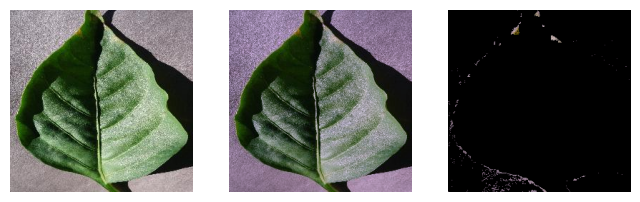

43 Pepper,_bell___healthy 1b574484-60cd-4ae4-83ed-511a5ae07ea8___JR_HL 7849.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[322.81034007354384, 388.12412149175395, 313.55275735295373, 322.81034007354384, 0.8208543599025593, 0.7838717963842459, 0.8271684298113017, 0.8208543599025593, 0.9189512467453144, 0.9177724564450342, 0.9192728798777856, 0.9189512467453144, 0.9274591082140597, 0.9247409094129876, 0.9273131770531885, 0.9274591082140597, 0.8444713938947676, 0.8423062818091523, 0.8450626276787977, 0.8444713938947676, 2.80804227941183, 3.300807381776411, 2.7043504901961444, 2.808042279411

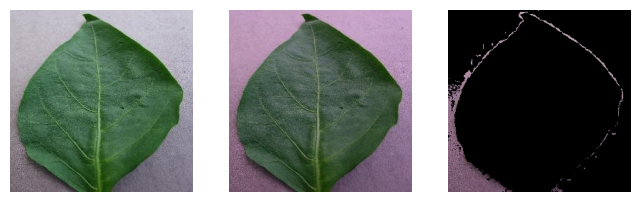

44 Pepper,_bell___healthy 1bfa8779-be94-4f16-9668-08c91f9ce3d6___JR_HL 8358.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[654.0241115196496, 671.943929257999, 659.9183976716095, 654.0241115196496, 0.7360616981121483, 0.727143344633806, 0.7330651369143277, 0.7360616981121483, 0.8662680225480385, 0.8663590344424122, 0.8663138761275107, 0.8662680225480385, 0.8703987743713802, 0.8705615727586351, 0.8704790627745789, 0.8703987743713802, 0.7504202868892889, 0.7505779765599889, 0.7504997319710718, 0.7504202868892889, 7.062285539215851, 7.167458669742735, 7.072931985294295, 7.062285539215851, '

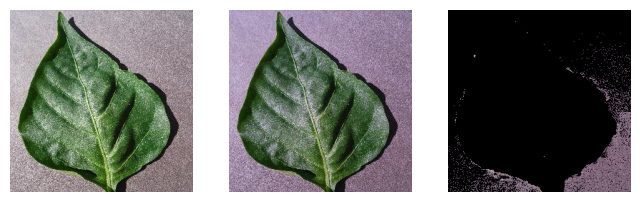

45 Pepper,_bell___healthy 1bfbdcd9-68ae-4676-9693-5f02fd310860___JR_HL 8715.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[1130.1625765931692, 1138.2354325259817, 1122.6751838235605, 1130.1625765931692, 0.3625728936701796, 0.35593354463354343, 0.36803320228222164, 0.3625728936701796, 0.8882522567518563, 0.8883832513135578, 0.8884207719072803, 0.8882522567518563, 0.8908184022477404, 0.8905761076287904, 0.8906804187004809, 0.8908184022477404, 0.7889920716247656, 0.789224801214448, 0.7892914679563278, 0.7889920716247656, 10.007398897058772, 10.05980776624394, 9.955545343137217, 10.007398897

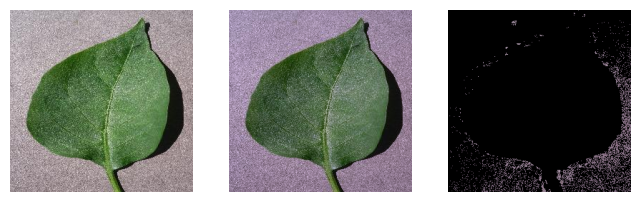

46 Pepper,_bell___healthy 1c043016-2d55-444d-a379-4a2aafc41a32___JR_HL 7909.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[1245.094408701087, 1406.391034217664, 1220.8844515932306, 1245.094408701087, 0.87216606565162, 0.8555631149909465, 0.8750217595606122, 0.87216606565162, 0.6610040968682708, 0.6591396402316511, 0.6611886903970151, 0.6610040968682708, 0.6865890613847699, 0.6809446826530331, 0.6862919215327217, 0.6865890613847699, 0.43692641607663835, 0.4344650653247104, 0.4371704843089199, 0.43692641607663835, 11.735677083333506, 12.810872741253874, 11.558287377451157, 11.7356770833335

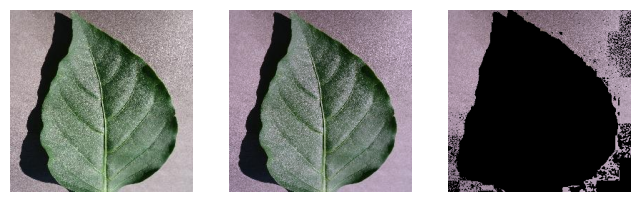

47 Pepper,_bell___healthy 1c159479-4972-41d3-a6ff-fbdb648d72c2___JR_HL 7575.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[122.84972426470635, 177.66129950019325, 122.92732843137286, 122.84972426470635, 0.4657870375497611, 0.22412623818333322, 0.461061780315622, 0.4657870375497611, 0.9931527287051398, 0.9921725736146133, 0.9932446571706214, 0.9931527287051398, 0.9935008035139672, 0.9922802318960358, 0.993465146821058, 0.9935008035139672, 0.9863523425344651, 0.9844064158330452, 0.9865349489979851, 0.9863523425344651, 0.7763174019607857, 1.1048366013071966, 0.7746629901960808, 0.7763174019

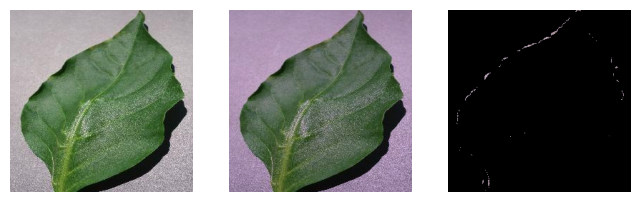

48 Pepper,_bell___healthy 1c41486f-bb0d-4808-b980-9fa4739f2ad3___JR_HL 8459.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[92.9321078431375, 84.36724336793581, 73.11216299019624, 92.9321078431375, 0.3336593437238334, 0.39742433456202136, 0.47577206845572484, 0.3336593437238334, 0.9927084967928472, 0.9929105482893569, 0.9933824676277283, 0.9927084967928472, 0.9928181063154013, 0.9931146885576003, 0.9936359633169147, 0.9928181063154013, 0.9854701596047143, 0.9858713569042712, 0.9868087269901548, 0.9854701596047143, 0.73621323529412, 0.6744175317185732, 0.5870098039215709, 0.73621323529412,

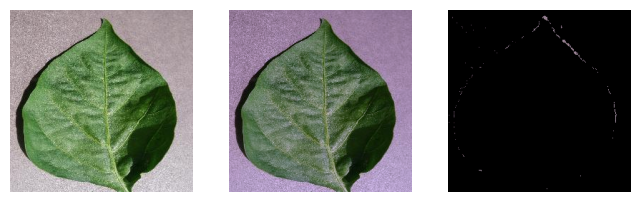

49 Pepper,_bell___healthy 1c665f14-938a-4563-8613-031a2cb04453___JR_HL 5815.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[76.16838235294144, 103.37030372933566, 76.25450367647102, 76.16838235294144, 0.4530635805338377, 0.25338288956093274, 0.44708425321358836, 0.4530635805338377, 0.9920037853435966, 0.99095751408152, 0.9920650588413923, 0.9920037853435966, 0.9922600130694541, 0.9910455012125422, 0.992229511927383, 0.9922600130694541, 0.9840715101360245, 0.9819967947146259, 0.9841930809739751, 0.9840715101360245, 0.6472732843137277, 0.881568627450987, 0.648498774509808, 0.647273284313727

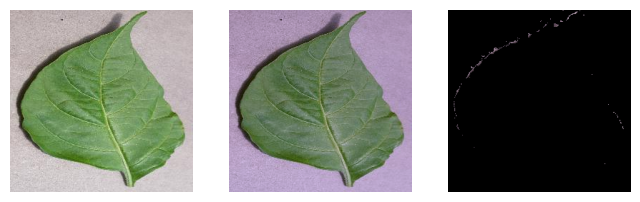

50 Pepper,_bell___healthy 1dab0ba9-9982-46ec-9ef6-70a1698baf04___JR_HL 8690.JPG -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[527.7631740196238, 644.6492272203062, 495.6339001225629, 527.7631740196238, 0.9470173673917976, 0.9351450201202898, 0.9502164482046108, 0.9470173673917976, 0.5840825128053093, 0.5832925247432986, 0.5858192386742288, 0.5840825128053093, 0.6703504777197246, 0.6457008219535788, 0.6571670850705892, 0.6703504777197246, 0.34115238176496426, 0.3402301694214116, 0.343184180400853, 0.34115238176496426, 6.1483149509804775, 7.38011534025397, 6.1112285539216264, 6.14831495098047

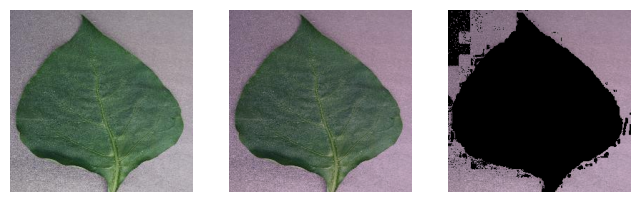

Done!!
Execution time: 8.3608 seconds


In [7]:
data_dir = "D:/pythonProject/datasets/test-dataset/color/train-50"
csv_file_path = "D:/pythonProject/Image-research/vision/c-color-train-50.csv"
process_images(data_dir, csv_file_path, printImages=True)

In [8]:
data_dir = "D:/pythonProject/datasets/test-dataset/segmented/train-40"
csv_file_path = "D:/pythonProject/Image-research/vision/c-segmented-train-40.csv"
process_images(data_dir, csv_file_path, printImages=False)

==================Image Processing==================
CSV file 'D:/pythonProject/Image-research/vision/c-segmented-train-40.csv' not found.
1 Pepper,_bell___Bacterial_spot 00f2e69a-1e56-412d-8a79-fdce794a17e4___JR_B.Spot 3132_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[125.24558823529844, 160.09910034603197, 126.26265318627838, 125.24558823529844, 0.8717605139282967, 0.8366803137902876, 0.870719136835074, 0.8717605139282967, 0.940595372955219, 0.9390092868049172, 0.9404421920228251, 0.940595372955219, 0.9457905453622999, 0.9427672598211649, 0.9446669072548929, 0.9457905453

In [9]:
data_dir = "D:/pythonProject/datasets/test-dataset/segmented/train-40b"
csv_file_path = os.path.join("D:/pythonProject/Image-research/vision/c-segmented-train-40b.csv")
process_images(data_dir, csv_file_path, printImages=False)

==================Image Processing==================
CSV file 'D:/pythonProject/Image-research/vision/c-segmented-train-40b.csv' not found.
1 Pepper,_bell___Bacterial_spot 00f2e69a-1e56-412d-8a79-fdce794a17e4___JR_B.Spot 3132_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[125.24558823529844, 160.09910034603197, 126.26265318627838, 125.24558823529844, 0.8717605139282967, 0.8366803137902876, 0.870719136835074, 0.8717605139282967, 0.940595372955219, 0.9390092868049172, 0.9404421920228251, 0.940595372955219, 0.9457905453622999, 0.9427672598211649, 0.9446669072548929, 0.945790545

In [11]:
data_dir = "D:/pythonProject/datasets/test-dataset/segmented/train-50"
csv_file_path = "D:/pythonProject/Image-research/vision/c-segmented-train-50.csv"
process_images(data_dir, csv_file_path, printImages=False)

==================Image Processing==================
CSV file 'D:/pythonProject/Image-research/vision/c-segmented-train-50.csv' not found.
1 Pepper,_bell___Bacterial_spot 00f2e69a-1e56-412d-8a79-fdce794a17e4___JR_B.Spot 3132_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[125.24558823529844, 160.09910034603197, 126.26265318627838, 125.24558823529844, 0.8717605139282967, 0.8366803137902876, 0.870719136835074, 0.8717605139282967, 0.940595372955219, 0.9390092868049172, 0.9404421920228251, 0.940595372955219, 0.9457905453622999, 0.9427672598211649, 0.9446669072548929, 0.9457905453

In [13]:
data_dir = "D:/pythonProject/datasets/test-dataset/segmented/train-mixed"
csv_file_path = "D:/pythonProject/Image-research/vision/c-segmented-train-mixed.csv"
process_images(data_dir, csv_file_path, printImages=False)

==================Image Processing==================
CSV file 'D:/pythonProject/Image-research/vision/c-segmented-train-mixed.csv' not found.
1 Pepper,_bell___Bacterial_spot 00f2e69a-1e56-412d-8a79-fdce794a17e4___JR_B.Spot 3132_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[125.24558823529844, 160.09910034603197, 126.26265318627838, 125.24558823529844, 0.8717605139282967, 0.8366803137902876, 0.870719136835074, 0.8717605139282967, 0.940595372955219, 0.9390092868049172, 0.9404421920228251, 0.940595372955219, 0.9457905453622999, 0.9427672598211649, 0.9446669072548929, 0.9457905

In [15]:
data_dir = "D:/pythonProject/datasets/test-dataset/segmented/trainb-50"
csv_file_path = "D:/pythonProject/Image-research/vision/c-segmented-trainb-50.csv"
process_images(data_dir, csv_file_path, printImages=False)

==================Image Processing==================
CSV file 'D:/pythonProject/Image-research/vision/c-segmented-trainb-50.csv' deleted successfully.
1 Tomato___Early_blight 004cbe60-8ff9-4965-92df-e86694d5e9ba___RS_Erly.B 8253_final_masked.jpg -------------------------------------------------------------
['contrast_0', 'contrast_45', 'contrast_90', 'contrast_135', 'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135', 'energy_0', 'energy_45', 'energy_90', 'energy_135', 'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135', 'ASM_0', 'ASM_45', 'ASM_90', 'ASM_135', 'dissimilarity_0', 'dissimilarity_45', 'dissimilarity_90', 'dissimilarity_135', 'label']
[188.71924019608645, 279.44642829682823, 200.50444240196825, 188.71924019608645, 0.9119025196551592, 0.8700204871882955, 0.9064009787491403, 0.9119025196551592, 0.9175568786442242, 0.914035247650494, 0.9170819232157421, 0.9175568786442242, 0.926144253755998, 0.9191757741991863, 0.9239611912488083, 0.92614